#Bouncing ball problem

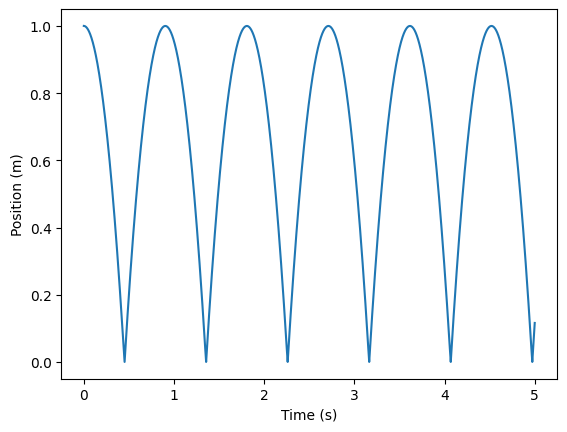

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

m= 0.1 #kg
z0 = 1 #metr
dt= 0.001
N = 5000 #for 5 seconds
g = 9.81
k=1e7


z= np.zeros(N) #z array
v=np.zeros(N) #vel array
z[0]=z0
t=np.linspace(0,5,N)
trev=np.flip(t)
zrev=np.flip(z)


for i in range(1,N):

  v[i]=v[i-1]-g*dt
  z[i]=z[i-1]+v[i]*dt
  if z[i]<0:
    v[i]=-v[i]
    z[i]=0


plt.plot(t,z)
plt.xlabel('Time (s)')
plt.ylabel('Position (m)')

plt.show()


# plt.plot(trev,zrev,color='red')
plt.show()











#Bouncing Dimer

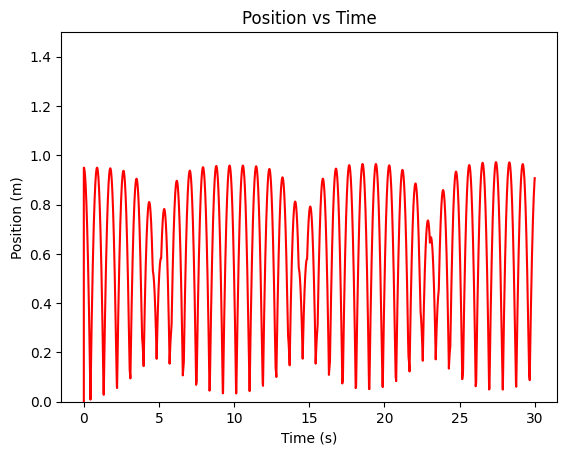

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

m=0.1 #kg
n=2 #no. of particles
dt=0.0001 #secs
tf = 30
N=tf/dt # total 50 secs
z0= 1 # metre
g=9.81
k=0.5
t=np.arange(0,tf,dt)
N = t.size

z=np.zeros((n,N),dtype=float)
z[0,0]=z0
z[1,0]=z0-0.1

zcml=np.zeros(N)

v=np.zeros((n,N),dtype=float)
v[0,0]=0
v[1,0]=0
for i in range(1,N):
  dz= (z[0,i-1]-z[1,i-1])

  v[0,i]=v[0,i-1]-(k/m)*dz*dt-g*dt
  v[1,i]=v[1,i-1]+(k/m)*dz*dt-g*dt

  z[0,i]=z[0,i-1]+v[0,i-1]*dt
  z[1,i]=z[1,i-1]+v[1,i-1]*dt

  if z[0,i]<0:
    z[0,i]=0
    v[0,i]=-v[0,i]
  elif z[1,i]<0:
    z[1,i]=0
    v[1,i]=-v[1,i]
  zcm=0.5*(z[0,i]+z[1,i])
  #print(zcm)
  zcml[i]=zcm

#plt.plot(t,z[0,:],color='blue')
#plt.plot(t,z[0],color='blue')
#plt.plot(t,z[1],color='blue')
plt.plot(t,zcml,color='red')
plt.xlabel('Time (s)')
plt.ylabel('Position (m)')
plt.title('Position vs Time')
# plt.grid(True)
plt.ylim(0,1.5)



plt.show()




#For 10 particles

from book

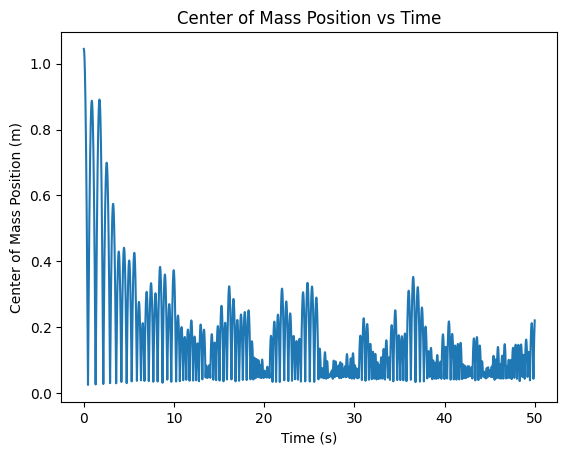

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
N = 10 # Nr of elements
k = 100000  # Spring constant
kw = 1000000  # Wall spring constant
d = 0.1  # Size in m
m = 0.1  # Mass in kg
t = 50.0  # Simulation time
g = 9.81  # Acceleration due to gravity
z0 = 1 # Initial height
dt = 0.00001  # Timestep
nstep = int(t / dt)  # Number of steps

# Initialization
z = np.zeros((N, nstep), float)  # Position of each element over time
vz = np.zeros((N, nstep), float)  # Velocity of each element over time
z[:, 0] = d * (np.array(range(N))) / N + z0  # Initial positions
l = d / N  # Equilibrium distance between nodes

# Time loop
for i in range(nstep - 1):  # Calculate motion
    dz = np.diff(z[:, i]) - l
    F = -k * np.append(0.0, dz) + k * np.append(dz, 0.0) - m * g  # Internode forces
    F[0] -= kw * z[0, i] * (z[0, i] < 0)  # Bottom wall
    a = F / m  # Acceleration
    vz[:, i + 1] = vz[:, i] + a * dt  # Update velocity
    z[:, i + 1] = z[:, i] + vz[:, i + 1] * dt  # Update position

# Calculate center of mass
z_cm = np.mean(z, axis=0)  # Center of mass over time
time = np.arange(0, (nstep - 1) * dt, dt)  # Time array matches the number of computed steps

# Plotting the center of mass over time
plt.plot(time, z_cm[:-1])  # z_cm and time should now match in length
plt.xlabel('Time (s)')
plt.ylabel('Center of Mass Position (m)')
plt.title('Center of Mass Position vs Time')
# plt.grid(True)
plt.show()


#Gas Simulations

[500. 499. 498. ... 253. 252. 253.]


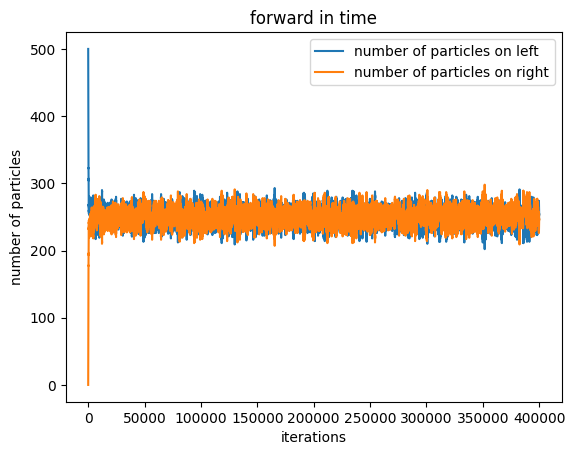

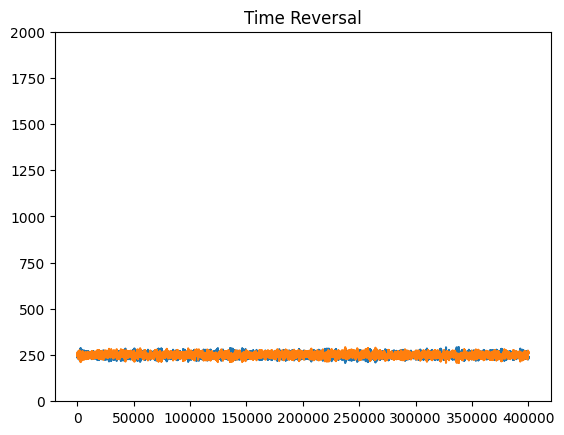

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random



n=4*(100000)#iterations
N =500#no. of particles

nleft=np.zeros(n)
nright=np.zeros(n)

nleft[0]=N

for i in range(0,n-1):
  r= random.uniform(0,1)
  if r<= (nleft[i]/N):
    nleft[i+1]=nleft[i]-1
    nright[i+1]=nright[i]+1
  else:
    nleft[i+1]=nleft[i]+1
    nright[i+1]=nright[i]-1

print(nleft)

plt.plot(nleft,label='number of particles on left')
plt.plot(nright,  label='number of particles on right')
plt.xlabel('iterations')
plt.ylabel('number of particles')
plt.legend()
plt.title('forward in time')
plt.show()


#checking time reversal

ntimerevleft=np.zeros(n)
ntimerevright=np.zeros(n)

ntimerevleft[0]=nleft[n-1]
ntimerevright[0]=nright[n-1]

for i in range(0,n-1):
  r= random.uniform(0,1)
  if r<= (ntimerevleft[i]/N):
    ntimerevleft[i+1]=ntimerevleft[i]-1
    ntimerevright[i+1]=ntimerevright[i]+1
  else:
    ntimerevleft[i+1]=ntimerevleft[i]+1
    ntimerevright[i+1]=ntimerevright[i]-1

plt.plot(ntimerevleft)
plt.plot(ntimerevright)
plt.ylim(0,2000)
plt.title('Time Reversal')
plt.show()







##Only from one side

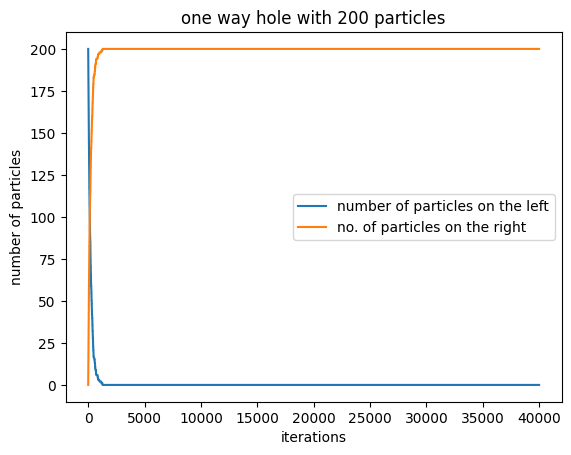

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

n=4*(10000)#iterations
N =200#no. of particles

nleft=np.zeros(n)
nright=np.zeros(n)

nleft[0]=N
nright[0]=0

for i in range(0,n-1):
  r= random.uniform(0,1)
  if r<= (nleft[i]/N):
    nleft[i+1]=nleft[i]-1
    nright[i+1]=nright[i]+1
  else:
    nleft[i+1]=nleft[i]
    nright[i+1]=nright[i]



plt.plot(nleft, label='number of particles on the left')
plt.plot(nright, label='no. of particles on the right')
plt.xlabel('iterations')
plt.ylabel('number of particles')
plt.title('one way hole with 200 particles')
plt.legend()
plt.show()



##Two size particles

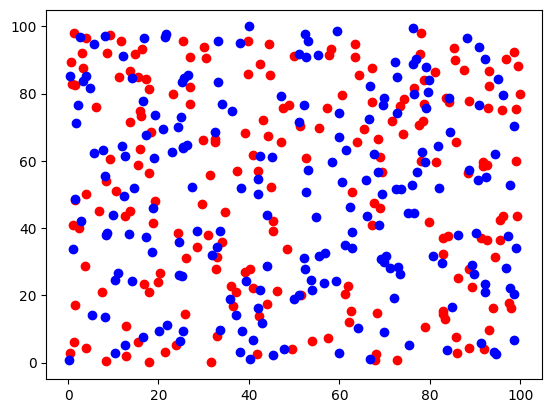

[107]
[93]
[94]
[106]
[107, 106, 107, 108, 107, 108, 107, 106, 105, 104, 105, 106, 107, 106, 105, 106, 105, 106, 105, 104, 103, 102, 101, 100, 99, 100, 101, 102, 101, 100, 99, 98, 99, 100, 99, 98, 99, 98, 97, 96, 97, 98, 97, 98, 99, 98, 99, 98, 99, 98, 99, 100, 101, 102, 101, 100, 101, 102, 103, 102, 101, 100, 99, 100, 101, 100, 99, 98, 99, 98, 99, 100, 99, 100, 99, 100, 99, 98, 97, 96, 95, 96, 97, 96, 97, 98, 97, 98, 97, 98, 99, 98, 99, 100, 101, 102, 101, 102, 101, 100, 101, 102, 103, 104, 105, 106, 105, 104, 105, 104, 103, 104, 105, 104, 103, 102, 103, 104, 105, 106, 105, 104, 103, 102, 103, 104, 103, 102, 103, 104, 103, 104, 105, 106, 105, 106, 107, 108, 107, 106, 105, 106, 105, 106, 107, 108, 109, 108, 109, 108, 107, 106, 107, 108, 107, 106, 107, 108, 107, 108, 107, 108, 107, 108, 107, 108, 109, 108, 107, 108, 107, 106, 107, 106, 107, 108, 107, 108, 109, 108, 109, 108, 109, 110, 109, 110, 111, 112, 111, 112, 113, 112, 111, 110, 109, 108, 107, 106, 105, 106, 105, 104, 105, 104, 103

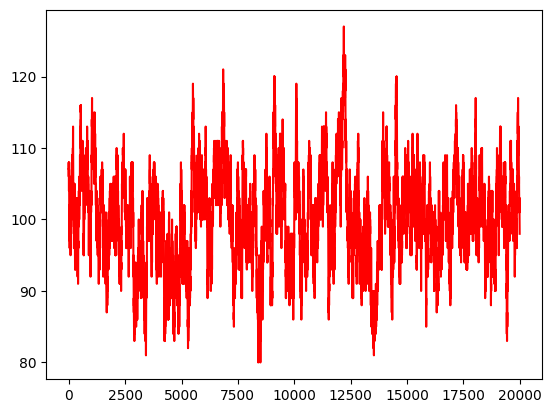

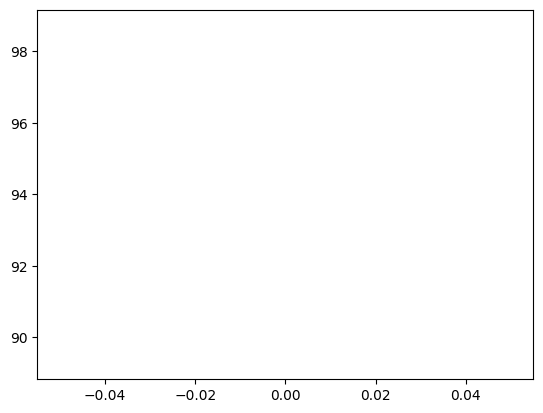

In [ ]:
#lets take red and blue particles

#red smaller, blue bigger

n=200
l=100

xred=np.zeros(n)
yred=np.zeros(n)

for i in range(0,n):
  xred[i]=random.uniform(0,l)
  yred[i]=random.uniform(0,l)

xblue=np.zeros(n)
yblue=np.zeros(n)

for i in range(0,n):
  xblue[i]=random.uniform(0,l)
  yblue[i]=random.uniform(0,l)

plt.plot(xred,yred,'ro')
plt.plot(xblue,yblue,'bo')
plt.show()

#counting particles

redleft=[0]
redright=[0]
blueleft=[0]
blueright=[0]
for i in range(0,n):
  if xred[i]<0.5*l:
    redleft[0]=redleft[0]+1
  if xred[i]>0.5*l:
    redright[0]=redright[0]+1

  if xblue[i]<0.5*l:
    blueleft[0]=blueleft[0]+1
  if xblue[i]>0.5*l:
    blueright[0]=blueright[0]+1

print(redleft)
print(redright)
print(blueleft)
print(blueright)

#transferring particles
iterations=20000

nr=[]
nb=[]
Nr=[]
for i in range (0,iterations):
  r= random.uniform(0,1)
  nr.append(redleft[0])
  Nr.append(redright[0])
  if r<= (redleft[0]/n):

    redleft[0]=redleft[0]-1
    redright[0]=redright[0]+1
  else:
    redright[0]=redright[0]-1
    redleft[0]=redleft[0]+1


print(nr)
print(Nr)

plt.plot(nr,color='red')
plt.show()
plt.plot(blueleft,color='blue')
plt.show()

##leonard jones gas


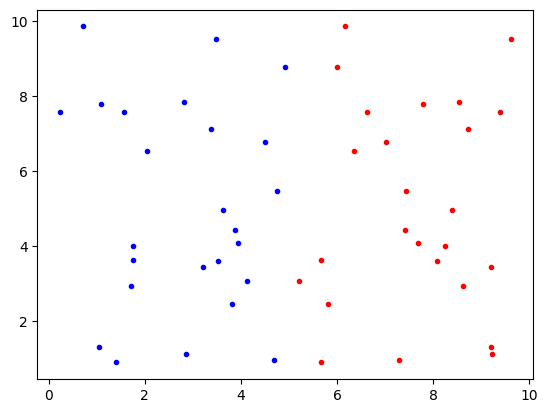

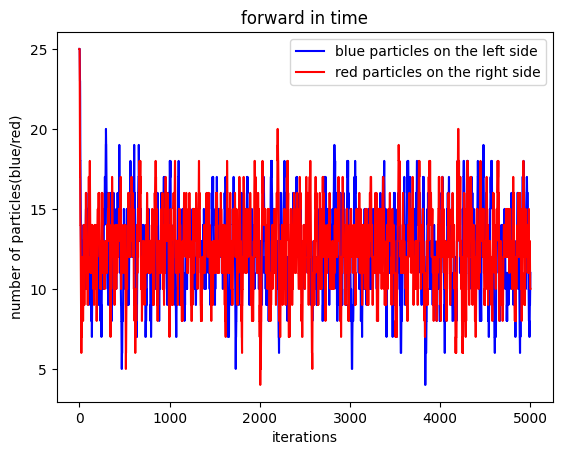

12.474105178964207
12.494101179764048


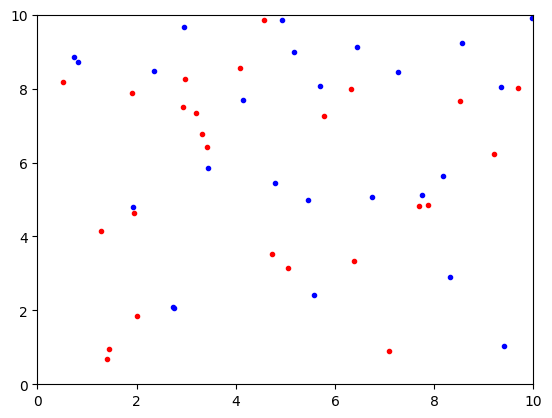

5000
5001
5001


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random


n = 50 #number of particles
l=10 #length of box
m=1
t=50
dt=0.01

epsilon=0.1                      # Changed the values here
sigma=0.01

nc=np.zeros((n,2)) #number of particles,coordinates
nv=np.zeros((n,2)) #number of particles,velocities

#initialising the gas

for i in range(int(n/2)):
  nc[i,0]=random.uniform(0,0.5*l)
  nc[i,1]=random.uniform(0,l)
  nv[i,0]=random.uniform(-30,30)
  nv[i,1]=random.uniform(-30,30)

for i in range (int(n/2),n):
  nc[i,0]=random.uniform(0.5*l,l)
  nc[i,1]=random.uniform(0,l)
  nv[i,0]=random.uniform(-30,30)
  nv[i,1]=random.uniform(-30,30)


plt.plot(nc[0:int(0.5*n),0],nc[0:int(0.5*n),1],'.',color='blue')
plt.plot(nc[int(0.5*n):n,0],nc[0:int(0.5*n),1],'.',color='red')
plt.show()




# defining parameters


def f(t1,t2):

  r =np.sqrt((t2-t1)@(t2-t1))
  r = max(sigma,r)                # Made the minima modification here.
  r6 = (sigma / r) ** 6
  r12 = r6 ** 2
  force_magnitude = 24 * epsilon * (2 * r12 - r6) / r
  return force_magnitude

def fx(t1,t2):
  r=np.sqrt((t2-t1)@(t2-t1))
  r = max(sigma,r)                # Made the minima modification here.
  return f(t1,t2)*((t2-t1)[0])/r


def fy(t1,t2):
  r=np.sqrt((t2-t1)@(t2-t1))
  r = max(sigma,r)                # Made the minima modification here.
  return f(t1,t2)*((t2-t1)[1])/r



iterations=int(t/dt)

cutoff=2.5

def distance(t1,t2):
  return np.sqrt((t2-t1)@(t2-t1))

nblueleft=[n/2]
nrightred=[n/2]

for i in range(iterations):
  #counter
  leftblue=0
  rightred=0

  for j in range(n):


#boundary conditions

    if nc[j,0]<=0 :
      nc[j,0]=nc[j,0]+l
    if nc[j,0]>=l:
      nc[j,0]=nc[j,0]-l
    if nc[j,1]<=0 :
      nc[j,1]=nc[j,1]+l
    if nc[j,1]>=l:
      nc[j,1]=nc[j,1]-l

    for k in range(j+1,n):

      if distance(nc[j,:],nc[k,:])<=cutoff:
        ax = fx(nc[j,:],nc[k,:])/m
        ay = fy(nc[j,:],nc[k,:])/m
        nv[j,0]=nv[j,0]-ax*dt
        nv[j,1]=nv[j,1]-ay*dt
        nv[k,0]=nv[k,0]+ax*dt
        nv[k,1]=nv[k,1]+ay*dt

    nc[j]=nc[j]+nv[j]*dt
        #periodic boundary condtions
    if nc[j,0]<=0 :
      nc[j,0]=nc[j,0]+l
    if nc[j,0]>=l:
      nc[j,0]=nc[j,0]-l
    if nc[j,1]<=0 :
      nc[j,1]=nc[j,1]+l
    if nc[j,1]>=l:
      nc[j,1]=nc[j,1]-l






#counter

  for j in range (int(0.5*n)):
    if nc[j,0]<0.5*l:
      leftblue=leftblue+1

  for j in range (int(0.5*n),n):
    if nc[j,0]>0.5*l:
      rightred=rightred+1

  nblueleft.append(leftblue)
  nrightred.append(rightred)

plt.plot(nblueleft,color='blue',label='blue particles on the left side')

plt.plot(nrightred,color='red', label='red particles on the right side')
plt.xlabel('iterations')
plt.ylabel('number of particles(blue/red)')
plt.title('forward in time')
plt.legend()

plt.show()
print(np.average(nblueleft))
print(np.average(nrightred))
plt.plot(nc[0:int(0.5*n),0],nc[0:int(0.5*n),1],'.',color='blue')
plt.plot(nc[int(0.5*n):n,0],nc[int(0.5*n):n,1],'.',color='red')
plt.xlim(0,l)
plt.ylim(0,l)
plt.show()

print(iterations)
print(len(nblueleft))
print(len(nrightred))




##Reversing initial conditions of leonard jones gas


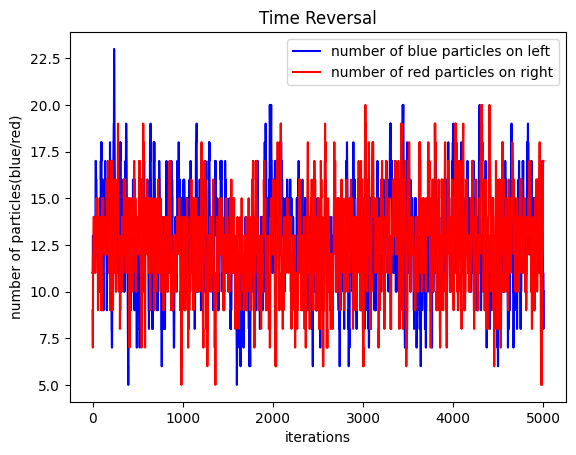

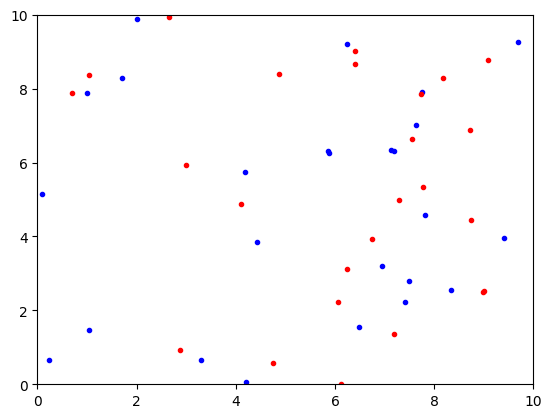

In [ ]:

nbl=[nblueleft[iterations]]
nrr=[nrightred[iterations]]

#reversing all velocities

for i in range(n):
  nv[i,0]=-nv[i,0]
  nv[i,1]=-nv[i,1]

for i in range(iterations):
  #counter
  leftblue=0
  rightred=0

  for j in range(n):

    #periodic boundary condtions
    if nc[j,0]<=0 :
      nc[j,0]=nc[j,0]+l
    if nc[j,0]>=l:
      nc[j,0]=nc[j,0]-l
    if nc[j,1]<=0 :
      nc[j,1]=nc[j,1]+l
    if nc[j,1]>=l:
      nc[j,1]=nc[j,1]-l


    for k in range(j+1,n):

      if distance(nc[j,:],nc[k,:])<=cutoff:
        ax = fx(nc[j,:],nc[k,:])/m
        ay = fy(nc[j,:],nc[k,:])/m
        nv[j,0]=nv[j,0]-ax*dt
        nv[j,1]=nv[j,1]-ay*dt
        nv[k,0]=nv[k,0]+ax*dt
        nv[k,1]=nv[k,1]+ay*dt

    nc[j]=nc[j]+nv[j]*dt

    #periodic boundary condtions
    if nc[j,0]<=0 :
      nc[j,0]=nc[j,0]+l
    if nc[j,0]>=l:
      nc[j,0]=nc[j,0]-l
    if nc[j,1]<=0 :
      nc[j,1]=nc[j,1]+l
    if nc[j,1]>=l:
      nc[j,1]=nc[j,1]-l






#counter

  for j in range (int(0.5*n)):
    if nc[j,0]<0.5*l:
      leftblue=leftblue+1

  for j in range (int(0.5*n),n):
    if nc[j,0]>0.5*l:
      rightred=rightred+1

  nbl.append(leftblue)
  nrr.append(rightred)

plt.plot(nbl,color='blue',label='number of blue particles on left')

plt.plot(nrr,color='red',label='number of red particles on right')
plt.xlabel('iterations')
plt.ylabel('number of particles(blue/red)')
plt.title('Time Reversal')
plt.legend()
plt.show()

plt.plot(nc[0:int(0.5*n),0],nc[0:int(0.5*n),1],'.',color='blue')
plt.plot(nc[int(0.5*n):n,0],nc[int(0.5*n):n,1],'.',color='red')
plt.xlim(0,l)
plt.ylim(0,l)
plt.show()





















#Coin flipping

[10000, 5022, 5038, 4894, 5026, 4998, 4993, 4937, 5081, 5005, 5083, 5053, 4963, 5047, 4952, 5014, 4940, 4908, 4936, 4983, 4965, 5024, 5009, 5024, 5042, 4895, 4960, 4979, 5071, 4864, 4942, 5001, 4943, 4985, 5011, 5119, 4977, 5026, 4957, 5032, 5034, 5018, 5020, 5011, 5031, 5036, 5004, 5092, 5003, 4967, 4947, 4982, 4923, 4900, 5115, 5054, 5047, 4999, 5047, 4991, 5032, 4977, 4959, 5113, 4973, 4994, 5014, 4910, 5088, 5045, 4990, 4997, 4957, 4936, 4957, 4913, 4999, 5008, 4959, 5002, 4978, 4949, 4988, 5009, 5110, 5008, 5066, 4994, 4970, 5038, 4982, 5029, 5054, 4977, 5004, 5028, 5017, 5031, 4959, 4909, 4936, 5017, 4989, 5056, 4989, 5032, 4979, 4867, 4955, 4987, 5050, 5072, 5042, 5034, 4977, 5024, 4967, 5017, 4979, 4959, 4959, 5003, 4994, 4994, 4955, 5039, 4952, 5051, 5026, 5048, 5116, 4948, 5018, 5056, 4964, 5021, 5048, 5021, 5012, 4880, 5106, 5023, 4993, 4946, 4960, 5018, 4860, 4943, 4954, 5020, 5030, 4967, 4921, 5049, 4963, 4940, 5070, 4918, 4962, 4993, 5045, 5031, 4995, 4946, 5006, 4974, 49

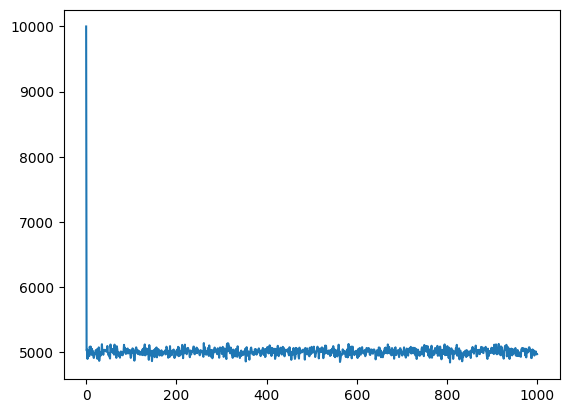

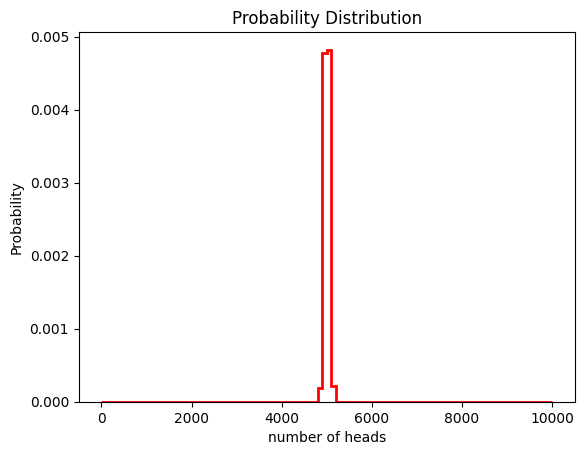

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

n=10000 #number of coins
i=1000 #number of iterations

config=np.zeros((n,i))

config[:,0]=1 #all heads initially

heads=[n]

for k in range(0,i):
    number=0
    for j in range(0,n):
        config[j,k]=np.random.randint(0,2) #tossing

        #counting number of heads
        if config[j,k]==1:
            number=number+1

    heads.append(number)

print(heads)


plt.plot(heads)
plt.show()

config2=np.zeros((n,i))
config2[:,0]=config[:,i-1]

heads_2=[]

for k in range(0,i):
    number_=0
    for j in range(0,n):
        config[j,k]=np.random.randint(0,2) #tossing

        #counting number of heads
        if config[j,k]==1:
            number_=number_+1

    heads_2.append(number_)

#plotting a frequency histogram

plt.hist(heads_2,bins=100,density=True,histtype='step',linewidth=2,range=(0,n),color='red')

plt.title('Probability Distribution')
plt.xlabel('number of heads')
plt.ylabel('Probability')
plt.show()

# animations

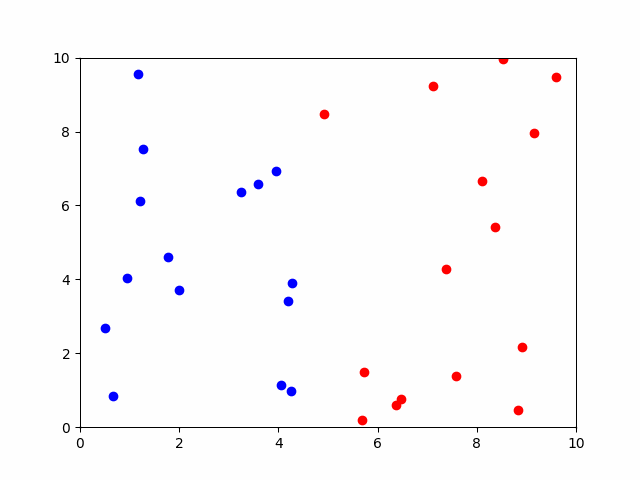

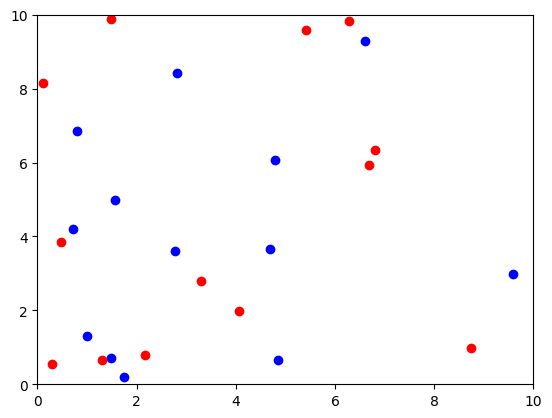

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
from matplotlib.animation import FuncAnimation, PillowWriter
from scipy.spatial import cKDTree

# Initialize parameters
n = 30  # Reduced number of particles
l = 10  # length of box
m = 1
t = 20  # Reduced total simulation time
dt = 0.01
epsilon = 0.1
sigma = 0.01
cutoff = 2.5
cutoff_squared = cutoff ** 2  # Precompute cutoff squared to avoid recalculating

nc = np.zeros((n, 2))  # particle coordinates
nv = np.zeros((n, 2))  # particle velocities

# Initialize the gas with positions and velocities
for i in range(int(n / 2)):
    nc[i, 0] = random.uniform(0, 0.5 * l)
    nc[i, 1] = random.uniform(0, l)
    nv[i, 0] = random.uniform(-30, 30)
    nv[i, 1] = random.uniform(-30, 30)

for i in range(int(n / 2), n):
    nc[i, 0] = random.uniform(0.5 * l, l)
    nc[i, 1] = random.uniform(0, l)
    nv[i, 0] = random.uniform(-30, 30)
    nv[i, 1] = random.uniform(-30, 30)

# Lennard-Jones force calculation (with precomputed distances)
def f(r_squared):
    r2_inv = sigma ** 2 / r_squared
    r6_inv = r2_inv ** 3
    r12_inv = r6_inv ** 2
    force_magnitude = 24 * epsilon * (2 * r12_inv - r6_inv) / r_squared
    return force_magnitude

# Set up the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(0, l)
ax.set_ylim(0, l)

blue_particles, = ax.plot([], [], 'bo', label="Blue Particles")
red_particles, = ax.plot([], [], 'ro', label="Red Particles")

# Initialize the animation
def init():
    blue_particles.set_data([], [])
    red_particles.set_data([], [])
    return blue_particles, red_particles

# Update function for animation
def update(frame):
    # Create a k-d tree for efficient neighbor lookup
    tree = cKDTree(nc)

    # Find pairs of particles within the cutoff distance
    pairs = tree.query_pairs(cutoff)

    for j in range(n):
        # Periodic boundary conditions
        if nc[j, 0] <= 0:
            nc[j, 0] += l
        if nc[j, 0] >= l:
            nc[j, 0] -= l
        if nc[j, 1] <= 0:
            nc[j, 1] += l
        if nc[j, 1] >= l:
            nc[j, 1] -= l

    # Apply forces only to nearby particles within cutoff
    for (j, k) in pairs:
        diff = nc[j] - nc[k]
        # Apply periodic boundary conditions on differences
        diff = diff - l * np.round(diff / l)

        r_squared = np.dot(diff, diff)
        if r_squared < cutoff_squared:
            force = f(r_squared)
            ax_force = force * diff[0] / np.sqrt(r_squared)
            ay_force = force * diff[1] / np.sqrt(r_squared)

            nv[j, 0] -= ax_force * dt
            nv[j, 1] -= ay_force * dt
            nv[k, 0] += ax_force * dt
            nv[k, 1] += ay_force * dt

    # Update positions based on velocities
    nc[:] += nv[:] * dt

    # Apply periodic boundary conditions after movement
    for j in range(n):
        if nc[j, 0] <= 0:
            nc[j, 0] += l
        if nc[j, 0] >= l:
            nc[j, 0] -= l
        if nc[j, 1] <= 0:
            nc[j, 1] += l
        if nc[j, 1] >= l:
            nc[j, 1] -= l

    # Update positions for blue and red particles
    blue_particles.set_data(nc[:int(0.5 * n), 0], nc[:int(0.5 * n), 1])
    red_particles.set_data(nc[int(0.5 * n):, 0], nc[int(0.5 * n):, 1])

    return blue_particles, red_particles

# Create animation
ani = FuncAnimation(fig, update, frames=int(t / dt), init_func=init, blit=True)

# Save animation as a GIF (reduced FPS to 30)
ani.save("optimized_particles.gif", writer=PillowWriter(fps=30))

# To display in a notebook (like Google Colab)
from IPython.display import Image
Image(filename="optimized_particles.gif")



ljp




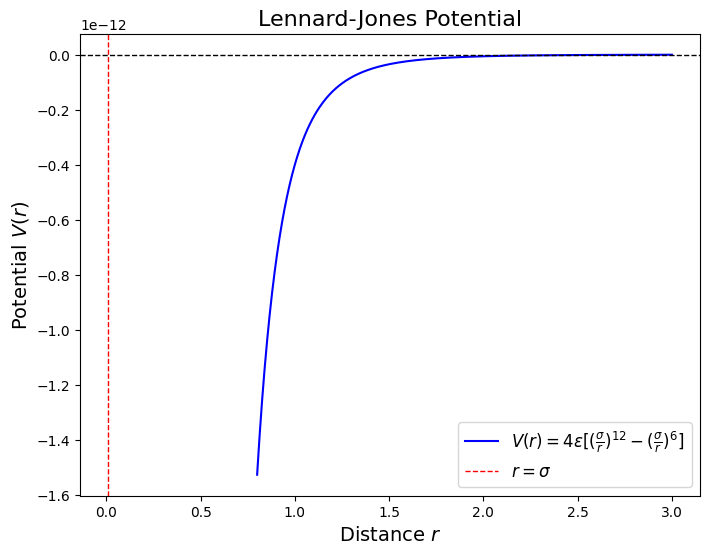

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters for Lennard-Jones potential
epsilon = 0.1  # Depth of the potential well
sigma = 0.01   # Distance at which potential is zero

# Define the Lennard-Jones potential function
def lennard_jones(r, epsilon, sigma):
    return 4 * epsilon * ((sigma / r)**12 - (sigma / r)**6)

# Generate values for r (distance between particles)
r = np.linspace(0.8, 3, 500)  # Avoiding r=0 to prevent division by zero

# Calculate potential values for each r
V = lennard_jones(r, epsilon, sigma)

# Plotting the Lennard-Jones potential
plt.figure(figsize=(8,6))
plt.plot(r, V, label=r'$V(r) = 4\epsilon [ (\frac{\sigma}{r})^{12} - (\frac{\sigma}{r})^6 ]$', color='b')
plt.axhline(0, color='k', linestyle='--', lw=1)  # Add horizontal line at V=0
plt.axvline(sigma, color='r', linestyle='--', lw=1, label=r'$r=\sigma$')  # Add vertical line at r=sigma
plt.title('Lennard-Jones Potential', fontsize=16)
plt.xlabel('Distance $r$', fontsize=14)
plt.ylabel('Potential $V(r)$', fontsize=14)
plt.legend(fontsize=12)

plt.show()


## mixing of gases alm

[1000. 1001. 1002. ... 1055. 1054. 1055.]


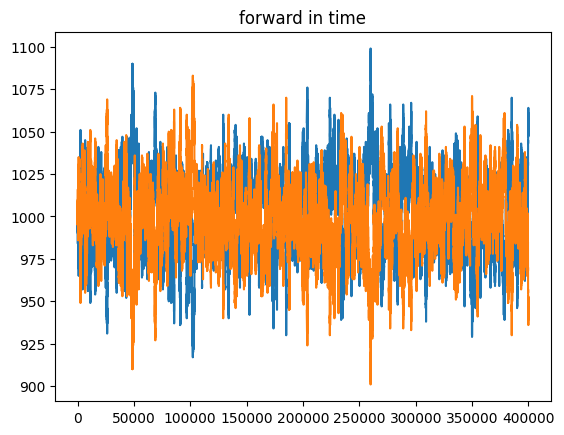

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random



n=4*(100000)#iterations
N =2000#no. of particles

nleft=np.zeros(n)
nright=np.zeros(n)

nleft[0]=N/2
nright[0]=N/2



for i in range(0,n-1):
  r= random.uniform(0,1)
  if r<= (nleft[i]/N):
    nleft[i+1]=nleft[i]-1
    nright[i+1]=nright[i]+1
  else:
    nleft[i+1]=nleft[i]+1
    nright[i+1]=nright[i]-1

print(nleft)

plt.plot(nleft)
plt.plot(nright)
plt.title('forward in time')
plt.show()






#diffusion

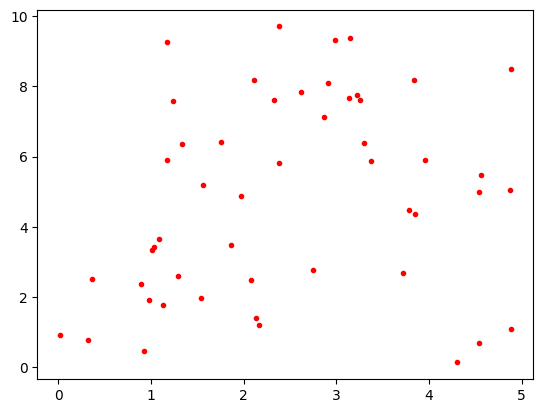

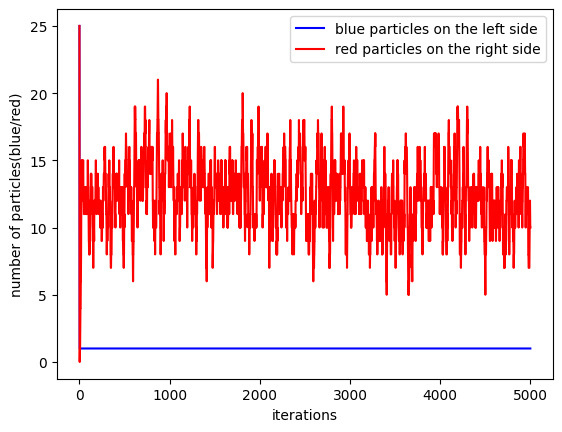

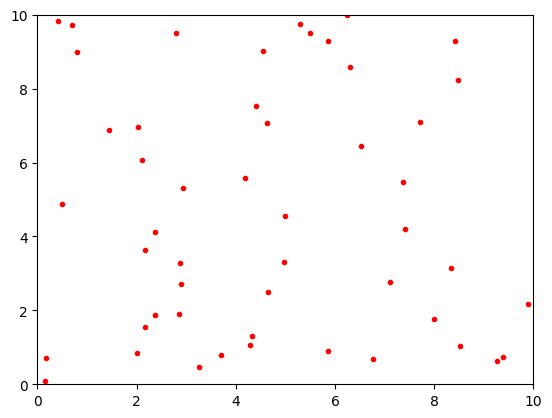

5000
5001
5001


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random


n = 50 #number of particles
l=10 #length of box
m=1
t=50
dt=0.01

epsilon=0.1                      # Changed the values here
sigma=0.01

nc=np.zeros((n,2)) #number of particles,coordinates
nv=np.zeros((n,2)) #number of particles,velocities

#initialising the gas

for i in range(int(n)):
  nc[i,0]=random.uniform(0,0.5*l)
  nc[i,1]=random.uniform(0,l)
  nv[i,0]=random.uniform(-30,30)
  nv[i,1]=random.uniform(-30,30)



plt.plot(nc[0:n,0],nc[0:n,1],'.',color='red')

plt.show()




# defining parameters


def f(t1,t2):

  r =np.sqrt((t2-t1)@(t2-t1))
  r = max(sigma,r)                # Made the minima modification here.
  r6 = (sigma / r) ** 6
  r12 = r6 ** 2
  force_magnitude = 24 * epsilon * (2 * r12 - r6) / r
  return force_magnitude

def fx(t1,t2):
  r=np.sqrt((t2-t1)@(t2-t1))
  r = max(sigma,r)                # Made the minima modification here.
  return f(t1,t2)*((t2-t1)[0])/r


def fy(t1,t2):
  r=np.sqrt((t2-t1)@(t2-t1))
  r = max(sigma,r)                # Made the minima modification here.
  return f(t1,t2)*((t2-t1)[1])/r



iterations=int(t/dt)

cutoff=2.5

def distance(t1,t2):
  return np.sqrt((t2-t1)@(t2-t1))

nleft=[n/2]
nright=[n/2]

for i in range(iterations):
  #counter
  left=0
  right=0

  for j in range(n):


#boundary conditions

    # if nc[j,0]<=0 :
    #  nv[j,0]=-nv[j,0]
    #  nc[j,0]=0
    # if nc[j,0]>=l:
    #  nv[j,0]=-nv[j,0]
    #  nc[j,0]=l

    # if nc[j,1]<=0 :
    #  nv[j,1]=-nv[j,1]
    #  nc[j,1]=0
    # if nc[j,1]>=l:
    #  nv[j,1]=-nv[j,1]
    #  nc[j,1]=l

    if nc[j,0]<=0 :
      nc[j,0]=nc[j,0]+l
    if nc[j,0]>=l:
      nc[j,0]=nc[j,0]-l
    if nc[j,1]<=0 :
      nc[j,1]=nc[j,1]+l
    if nc[j,1]>=l:
      nc[j,1]=nc[j,1]-l

    for k in range(j+1,n):

      if distance(nc[j,:],nc[k,:])<=cutoff:
        ax = fx(nc[j,:],nc[k,:])/m
        ay = fy(nc[j,:],nc[k,:])/m
        nv[j,0]=nv[j,0]-ax*dt
        nv[j,1]=nv[j,1]-ay*dt
        nv[k,0]=nv[k,0]+ax*dt
        nv[k,1]=nv[k,1]+ay*dt

    nc[j]=nc[j]+nv[j]*dt
        #periodic boundary condtions
    if nc[j,0]<=0 :
      nc[j,0]=nc[j,0]+l
    if nc[j,0]>=l:
      nc[j,0]=nc[j,0]-l
    if nc[j,1]<=0 :
      nc[j,1]=nc[j,1]+l
    if nc[j,1]>=l:
      nc[j,1]=nc[j,1]-l






#counter

  for j in range (int(0.5*n)):
    if nc[j,0]<0.5*l:
      left=+1

  for j in range (int(0.5*n),n):
    if nc[j,0]>0.5*l:
      right=right+1

  nleft.append(left)
  nright.append(right)

plt.plot(nleft,color='blue',label='blue particles on the left side')

plt.plot(nright,color='red', label='red particles on the right side')
plt.xlabel('iterations')
plt.ylabel('number of particles(blue/red)')
plt.legend()

plt.show()

plt.plot(nc[0:int(0.5*n),0],nc[0:int(0.5*n),1],'.',color='red')
plt.plot(nc[int(0.5*n):n,0],nc[int(0.5*n):n,1],'.',color='red')
plt.xlim(0,l)
plt.ylim(0,l)
plt.show()

print(iterations)
print(len(nblueleft))
print(len(nrightred))
